In [30]:
import numpy as np
import soundfile as sf
import librosa

import IPython.display as ipd
from matplotlib import pyplot as plt

In [31]:
%cd /content/drive/Shareddrives/BioSoundSCape_ABG/wavs_complexity_campaign2/

/content/drive/Shareddrives/BioSoundSCape_ABG/wavs_complexity_campaign2


22050


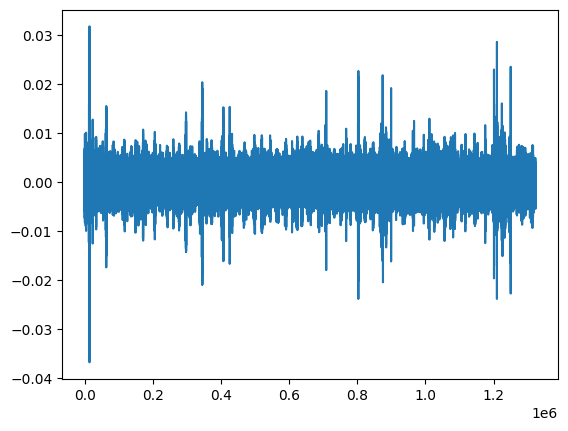

In [47]:
origWavName = "s2lam001_231025_2023-10-25_19-10.WAV"
origWav, sr = librosa.load(origWavName)
print(sr)
plt.plot(origWav)
ipd.Audio(origWav, rate=sr)

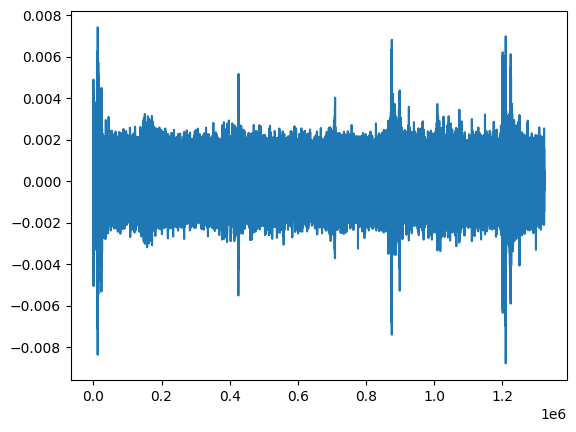

In [43]:
higherPitchWav = librosa.effects.pitch_shift(y=origWav, sr=sr, n_steps=30)
plt.plot(higherPitchWav)
ipd.Audio(higherPitchWav, rate=sr)

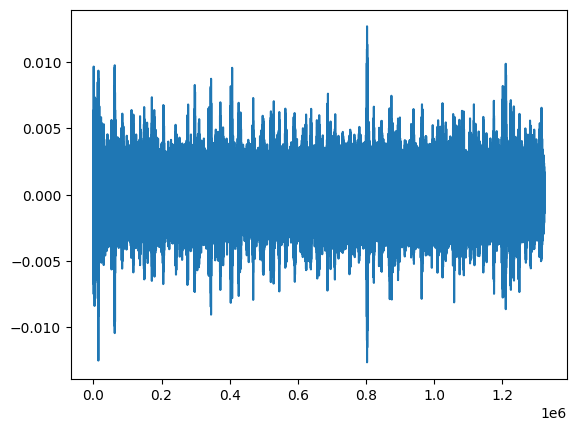

In [44]:
lowerPitchWav = librosa.effects.pitch_shift(y=origWav, sr=sr, n_steps=-2)
plt.plot(lowerPitchWav)
ipd.Audio(lowerPitchWav, rate=sr)

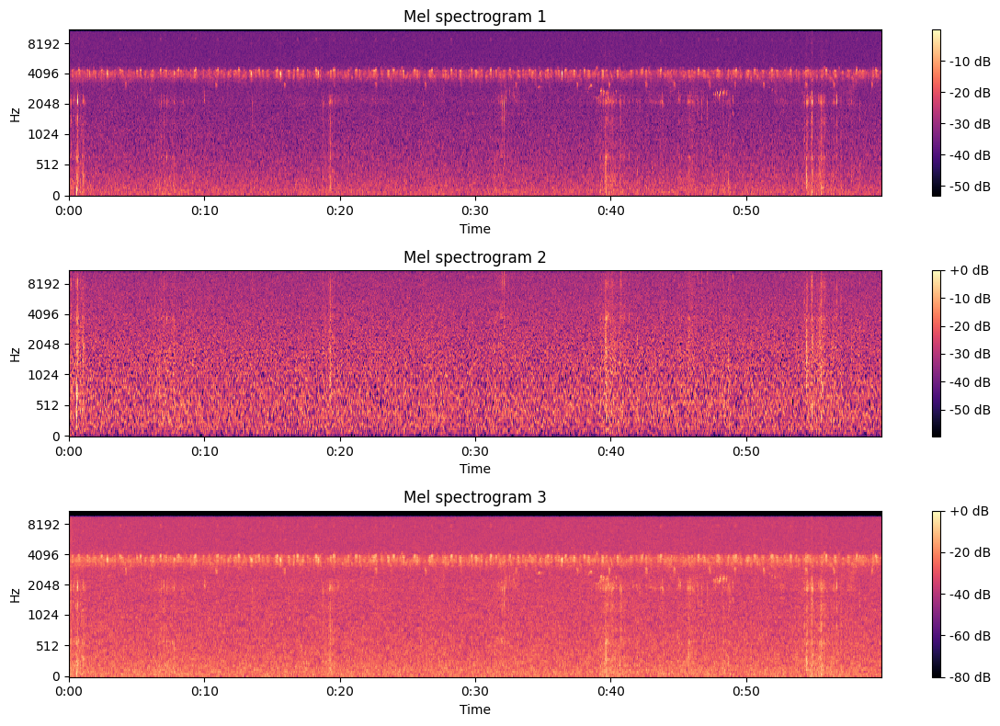

In [45]:
wav_data = [origWav, higherPitchWav, lowerPitchWav]

# Calculate mel spectrograms
mel_spectrograms = [librosa.feature.melspectrogram(y=y, sr=sr) for y in wav_data]

plt.figure(figsize=(12, 8))
for i, mel_spec in enumerate(mel_spectrograms):
    plt.subplot(len(mel_spectrograms), 1, i+1)
    librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), y_axis='mel', x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel spectrogram {i+1}')
    plt.tight_layout()

plt.show()